# **Download library and install library**

In [2]:
!pip install torch==1.10.0+cu102 torchvision==0.11.1+cu102 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu102/torch1.10.0/index.html
!pip install mmdet==2.17.0
!pip install icevision[all]
!pip install fastbook
!pip install gradio
!pip install icedata
!pip install progressbar2
!pip install tqdm
!pip install Shapely
!pip install icevision_dashboards


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu102/torch1.10.0/index.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached fastai-2.6.3-py3-none-any.whl (197 kB)
  Attempting uninstall: fastai
    Found existing installation: fastai 2.5.6
    Uninstalling fastai-2.5.6:
      Successfully uninstalled fastai-2.5.6
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple

## Import library

In [70]:
import json
import ast
import pandas as pd
import os.path as op
from pathlib import Path
from PIL import Image
import icevision
from icevision.models import *
from icevision.all import *
import icedata
import PIL, requests
import torch
from torchvision import transforms
import gradio as gr
from fastbook import *
from fastai.vision.all import *
import os.path as op
import pandas as pd
from tqdm import tqdm
from time import sleep
from glob import glob
from pathlib import Path
from sklearn.metrics import precision_recall_fscore_support, accuracy_score, roc_auc_score, plot_confusion_matrix ,  confusion_matrix
import matplotlib.pyplot as plt
from sklearn.svm import SVC
import os
import torch
import torchvision.transforms.functional as fn
from PIL import Image
from torchvision.transforms.functional import crop
import cv2
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
import panel
panel.extension()

# **Object detection ด้วย IceVision**

ใน Section นี้เราจะใช้ไลบรารี่ Icevision ในการสร้างโมเดล Object detection กัน

## Preparing data

In [ ]:
df = pd.read_csv("/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/train_labels.csv")
df.rename(columns={"class": "label"}, inplace=True)

In [ ]:
df.to_csv("/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/train_annotation.csv", index=False)

In [ ]:
df.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,B_C (1).jpg,1140,1520,mangda,226,431,884,1252
1,B_C (10).jpg,720,960,mangda,202,525,402,754
2,B_C (10).jpg,720,960,mangda,339,122,631,408
3,B_C (10).jpg,720,960,mangda,69,591,199,744
4,B_C (11).jpg,720,960,mangda,30,102,695,815


In [ ]:
df = pd.read_csv("/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/train_annotation.csv")

In [ ]:
template_record = ObjectDetectionRecord()

class YoloSmallDataset(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
        self.df = pd.read_csv("/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/train_annotation.csv")
        self.class_map = ClassMap(list(self.df['label'].unique()))

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def parse_fields(self, o, record, is_new):
        if is_new:
            record.set_filepath(op.join("/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/", "train", o.filename))
            record.set_img_size(ImgSize(width=o.width, height=o.height))
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

Tabs
    [0] Column
        [0] Markdown(str)
        [1] DataFrame(formatters={'no_imgs': HTMLTemplateFo...}, height=128, selection=[0], sizing_mode='fixed', value=   no_imgs  no_classes  ..., width=1500)
        [2] Markdown(str)
        [3] DataFrame(formatters={'Num. imgs.': HTMLTemplat...}, height=128, selection=[0], sizing_mode='fixed', value=   Num. imgs.  ..., width=1500)
        [4] Markdown(str)
        [5] DataFrame(formatters={'Class': HTMLTemplateForm...}, height=225, selection=[0], sizing_mode='fixed', value=    Class  avg_objects_per..., width=1500)
        [6] Row(align='center')
            [0] Bokeh(Figure)
    [1] GridSpec(align='center', height=900, ncols=2, nrows=2, sizing_mode='fixed', width=1500)
        [0] Column(height=450, width=750)
            [0] Markdown(str)
            [1] Bokeh(Figure)
        [1] Column(height=450, width=750)
            [0] Markdown(str)
            [1] Bokeh(Figure)
        [2] Column(align='center', height=900, width=750)
            [0] Column
                [0] Column(align='center')
                    [0] Row(width=750)
                        [0] Select(name='X-Axis', options=['num_annotations', ...], value='num_annotations')
                        [1] Select(name='Y-Axis', options=['label', 'num_annotations...], value='label')
                    [1] Row(width=750)
                        [0] Checkbox(name='X is categorical')
                        [1] Checkbox(name='Normalize rows')
                        [2] IntInput(end=10, name='Precision', start=0, value=2)
                    [2] Row(width=750)
                        [0] RangeSlider(end=15, name='X-Axis Range', start=1, step=0.28, value=(1, 15), value_end=15, value_start=1)
                        [1] IntInput(end=500, name='Bins', start=1, value=10)
                [1] ParamFunction(function)
    [2] Column
        [0] IntInput(height=50, name='Number of aspect ratios', sizing_mode='fixed', value=3, width=1500)
        [1] IntInput(height=50, name='Bins', sizing_mode='fixed', value=30, width=1500)
        [2] ParamFunction(function)
    [3] Column(align='center', sizing_mode='stretch_both')
        [0] Column
            [0] Column
                [0] Row
                    [0] Select(name='Sort by', options=['num_annotations', ...], value='num_annotations')
                    [1] CheckButtonGroup(name='Options', options=['Desc.', 'Drop d...])
                [1] Row(align='center', height=50)
                    [0] Button(name='<', width=166)
                    [1] TextInput(value='1', width=83)
                    [2] Row(width=83)
                        [0] Markdown(str)
                    [3] Button(name='>', width=166)
            [1] Row(align='center')
                [0] Bokeh(Figure)
    [4] DataFrame(formatters={'id': HTMLTemplateFormatt...}, height=900, selection=[0], sizing_mode='fixed', value=                id  width ..., width=1500)
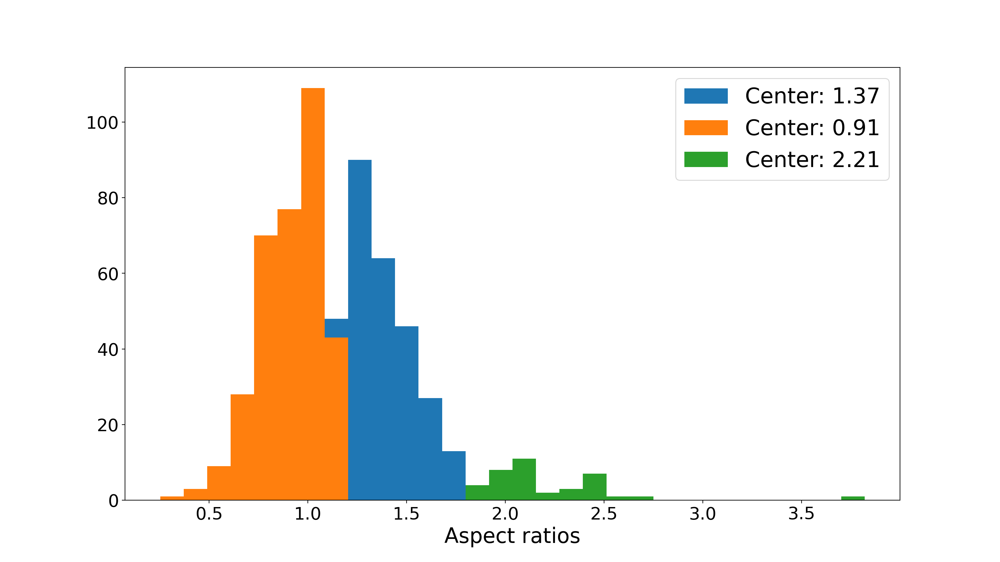

In [ ]:
#ดูลักษณะของข้อมูลต่างๆ
from icevision_dashboards.data import BboxRecordDataset
from icevision_dashboards.dashboards import ObjectDetectionDatasetOverview

train_dash_ds = BboxRecordDataset(train_records, class_map)
# create a new dashboard instance and display it with the .show() function
overview_dashboard = ObjectDetectionDatasetOverview(train_dash_ds, width=1500, height=900)
overview_dashboard.show()

In [ ]:
parser = YoloSmallDataset(template_record)
train_records, valid_records = parser.parse()

  0%|          | 0/844 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/374 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: F_C (21).jpg) - Clipping bbox xmax from 507 to image width 0 (Before: <BBox (xmin:54, ymin:15, xmax:507, ymax:560)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: F_C (21).jpg) - Clipping bbox ymax from 560 to image height 0 (Before: <BBox (xmin:54, ymin:15, xmax:0, ymax:560)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: F_C (21).jpg) - Cannot auto-fix coordinates: <BBox (xmin:54, ymin:15, xmax:0, ymax:0)>
	x_min:54 is greater than or equal to x_max:0
	y_min:15 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: F_C (21).jpg) Removed annotation with index: 0, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
AUTOFIX-SUCCESS - (record_id: F_C (28).jpg) - Clipping bbox xmax from 279 to image width 0 (Before: <BBox (xmin:53, ymin:113, xmax:279, ymax:405)>) | icevision.utils.logger_utils:autofix_log:17
AUTOF

In [ ]:
len(train_records), len(valid_records)

(299, 75)

## Load pretrain model

In [ ]:
model_type = icevision.models.mmdet.retinanet
backbone = model_type.backbones.resnet50_fpn_1x

In [ ]:
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=224, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(224), tfms.A.Normalize()])

In [ ]:
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

In [ ]:
train_dl = model_type.train_dl(train_ds, batch_size=64, num_workers=2, shuffle=True)
valid_dl = model_type.train_dl(train_ds, batch_size=64, num_workers=2, shuffle=False)

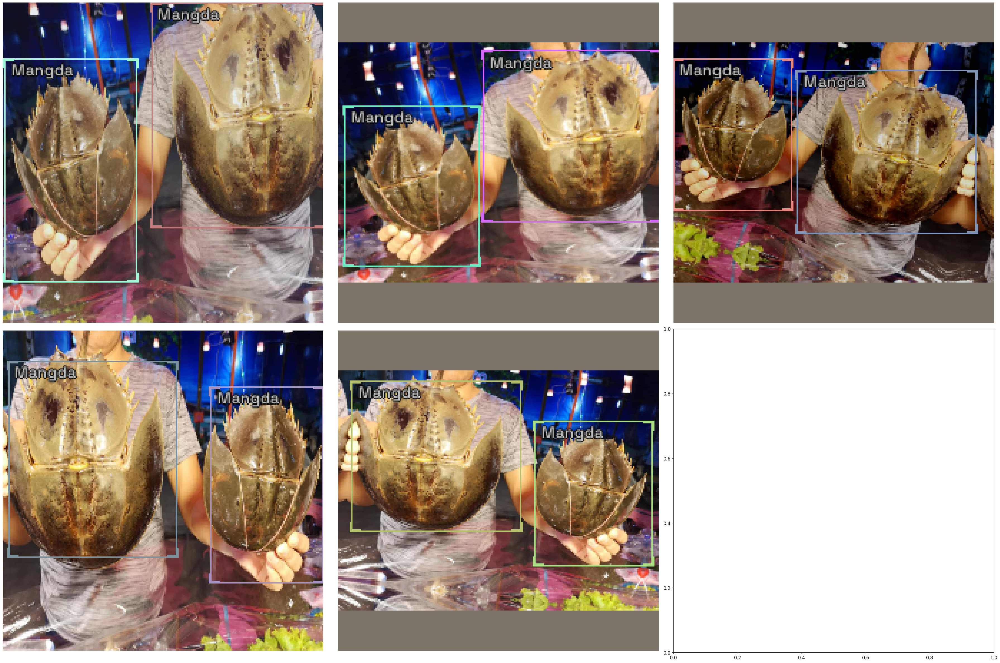

In [ ]:
samples = [train_ds[10] for _ in range(5)]
show_samples(samples, ncols=3)

In [ ]:
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map))

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]
learner = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=5.248074739938602e-05)

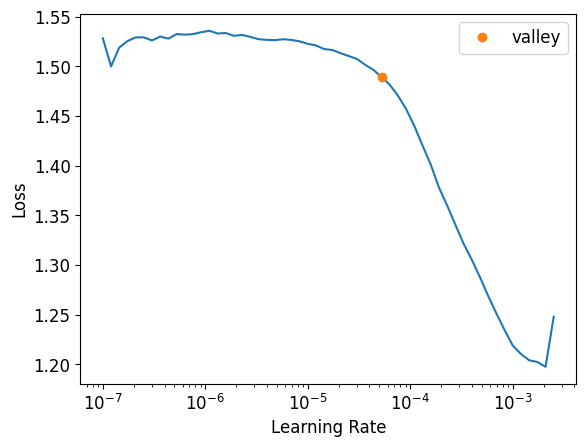

In [ ]:
learner.lr_find()

## Train mosel

In [ ]:
learner.fine_tune(200, 3e-03, freeze_epochs=1, )

epoch,train_loss,valid_loss,COCOMetric,time
0,0.122276,0.162238,0.785077,00:14


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,0.143299,0.130605,0.813855,00:14
1,0.137874,0.135975,0.807364,00:15
2,0.131915,0.128687,0.811096,00:15
3,0.130923,0.123340,0.827140,00:14
4,0.129618,0.127233,0.819547,00:15
5,0.127736,0.129160,0.804623,00:14
6,0.127488,0.124122,0.825178,00:15
7,0.126388,0.125321,0.810122,00:14
8,0.125991,0.121874,0.816894,00:14
9,0.125548,0.119812,0.826121,00:15


In [ ]:
m = ClassMap(list(df['label'].unique()))
m.get_classes()

['background', 'mangda']

In [ ]:
cd /content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp/model_OBJ

/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp/model_OBJ


In [ ]:
# เซฟโมเดลด้วยคำสั่ง `save_icevision_checkpoint`
checkpoint_path = "mangda_det_660.pth"
save_icevision_checkpoint(
    model, 
    model_name='mmdet.retinanet', 
    backbone_name='resnet50_fpn_1x',
    classes=m.get_classes(),
    img_size=224,
    filename=checkpoint_path,
    meta={"icevision_version": "0.12.0"}
)

## ผลการทำนายใน validation

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


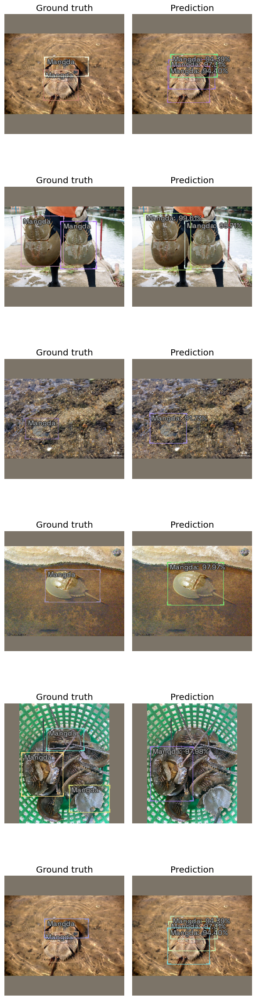

In [ ]:
#ดูผลการทำนายเทียบกับผลจริง
model_type.show_results(model_loaded["model"], valid_ds, detection_threshold=0.6)

# **Prediction**

ลองใช้โมเดลทำนายผลใน test set

In [ ]:
cd /content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp

/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp


In [ ]:
# โหลดโมเดลที่เซฟมาเพื่อทำนายผลใน validation set
model_loaded = model_from_checkpoint("./model_OBJ/mangda_det_240.pth")

In [ ]:
model = model_loaded['model']
model_type = model_loaded["model_type"]
backbone = model_loaded["backbone"]
class_map = model_loaded["class_map"]
img_size = model_loaded["img_size"]
model_type, backbone, class_map, img_size

(<module 'icevision.models.mmdet.models.retinanet' from '/usr/local/lib/python3.7/dist-packages/icevision/models/mmdet/models/retinanet/__init__.py'>,
 <ClassMap: {'background': 0, 'mangda': 1}>,
 224)

In [ ]:
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad((img_size,img_size)), tfms.A.Normalize()])

In [ ]:
cd /content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images

/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images


In [ ]:
path_to_image_folder = "/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/test"
img_files = get_image_files(path_to_image_folder)

In [ ]:
img_files[0:4]

(#4) [Path('/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/test/F_T (6).jpg'),Path('/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/test/F_T (10).jpg'),Path('/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/test/F_T (12).jpg'),Path('/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/test/F_T (15).jpg')]

In [ ]:
import torch

import torchvision.transforms.functional as fn

from PIL import Image

from torchvision.transforms.functional import crop
import cv2
import numpy as np

In [ ]:
img = PIL.Image.open(img_files[4])
img

In [ ]:
pred_dict

In [ ]:
img = PIL.Image.open(img_files[4])

pred_dict  = model_type.end2end_detect(img, valid_tfms, model, class_map=class_map, detection_threshold=0.5)
pred_dict['img']

In [ ]:
learn_BF = load_learner('./model_back_front/VGG16_fastai.pkl')
learn_B = load_learner('./model_back/densenet201_fastai.pkl')
learn_F = load_learner('./model_front/resnext50_fastai.pkl')

#Path directory files
directory_T = '/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/img_split/test/Tachypleus_gigas/'
directory_C ='/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/img_split/test/Carcinoscorpius_rotundicauda/'

#Class labels
T= 'Tachypleus_gigas'
C = 'Carcinoscorpius_rotundicauda'

In [ ]:
for i in range(len(pred_dict['detection']['bboxes'])):
  predict = []
  label = []
  pre = pred_dict['detection']['bboxes'][i-1]
  BBox_tensor = pre.to_tensor()
  BBox_list= BBox_tensor.tolist()
  # Setting the points for cropped image
  left = int(BBox_list[0])
  top = int(BBox_list[1])
  right = int(BBox_list[2])
  bottom = int(BBox_list[3])

 
  # Cropped image of above dimension
  # (It will not change original image)
  im1 = img.crop((left, top, right, bottom))
 
# Shows the image in image viewer
  im1.show()
  im1.resize((224,224))
  trans = transforms.ToPILImage()
  trans1 = transforms.ToTensor()
  im1 = trans(trans1(im1))
  im2 = np.array(im1)
  Pre_BF = learn_BF.predict(im2)[0]
  if Pre_BF == 'front' :# predict back or front
        Pre_F = learn_F.predict(im2)
        classes = ['Carcinoscorpius_rotundicauda', 'Tachypleus_gigas']
        prop_F = Pre_F[2].max()
        prop_float = prop_F.item()
        if prop_float > 0.6 : #weighrt predict 
          print('class:',Pre_F[0], ",accuracy =", '%.3f' %prop_float)
          predict.append(Pre_F[0])
        else:
          classes.remove(Pre_F[0])
          predict.append(classes[0])
          print('class:',classes[0], ",accuracy =", '%.3f' %prop_float)
  else:
        Pre_B = learn_B.predict(im2)
        prop_B = Pre_B[2].max()
        prop_float = prop_B.item()
        classes = ['Carcinoscorpius_rotundicauda', 'Tachypleus_gigas']
        if prop_float > 0.6 :
          print('class:',Pre_B[0], ",accuracy =", '%.3f' %prop_float)
          predict.append(Pre_B[0])
        else:
          classes.remove(Pre_B[0])
          predict.append(classes[0])
          print('class:',classes[0], ",accuracy =", '%.3f' %prop_float)

##ทดสอบด้วย**Multi images**

In [ ]:
cd /content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/result1_obj_detection

/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/result1_obj_detection


In [ ]:
from tqdm import tqdm
from time import sleep

In [ ]:
path_to_image_folder = "./images/test"

  0%|          | 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


ภาพที่ 1.00



  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:00<00:00,  2.05it/s]

class: Tachypleus_gigas ,accuracy = 0.943


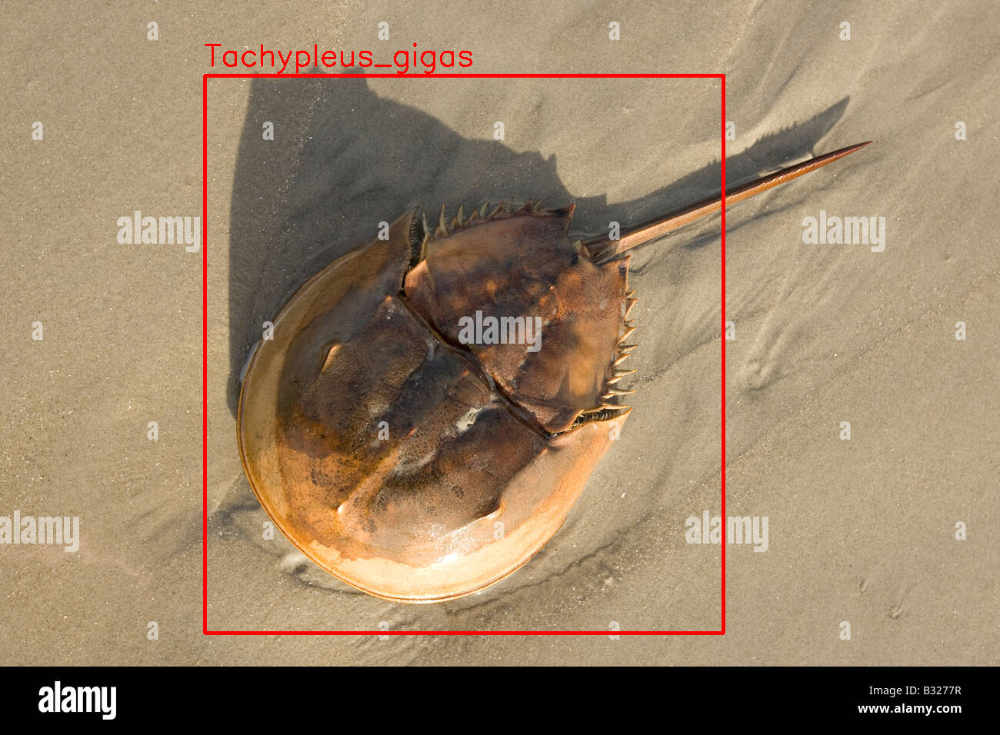

 20%|██        | 1/5 [00:01<00:06,  1.69s/it]

ภาพที่ 2.00



  0%|          | 0/3 [00:00<?, ?it/s]


 33%|███▎      | 1/3 [00:00<00:01,  1.96it/s]

class: Tachypleus_gigas ,accuracy = 0.574



 67%|██████▋   | 2/3 [00:01<00:00,  1.95it/s]

class: Carcinoscorpius_rotundicauda ,accuracy = 0.660



100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

class: Tachypleus_gigas ,accuracy = 0.678


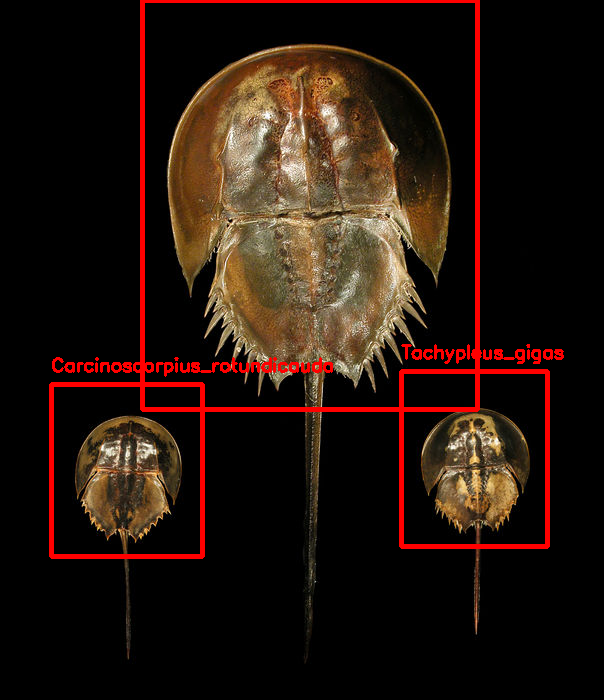

 40%|████      | 2/5 [00:03<00:05,  1.84s/it]

ภาพที่ 3.00



  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

class: Tachypleus_gigas ,accuracy = 0.815


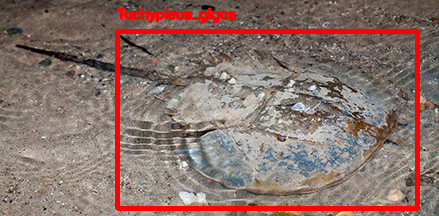

 60%|██████    | 3/5 [00:04<00:02,  1.40s/it]

ภาพที่ 4.00



  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

class: Tachypleus_gigas ,accuracy = 0.968


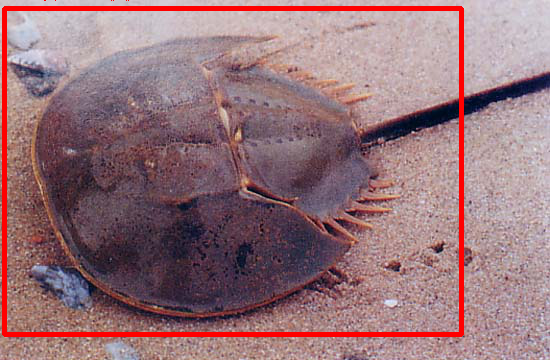

 80%|████████  | 4/5 [00:05<00:01,  1.23s/it]

ภาพที่ 5.00



  0%|          | 0/1 [00:00<?, ?it/s]


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

class: Tachypleus_gigas ,accuracy = 0.857


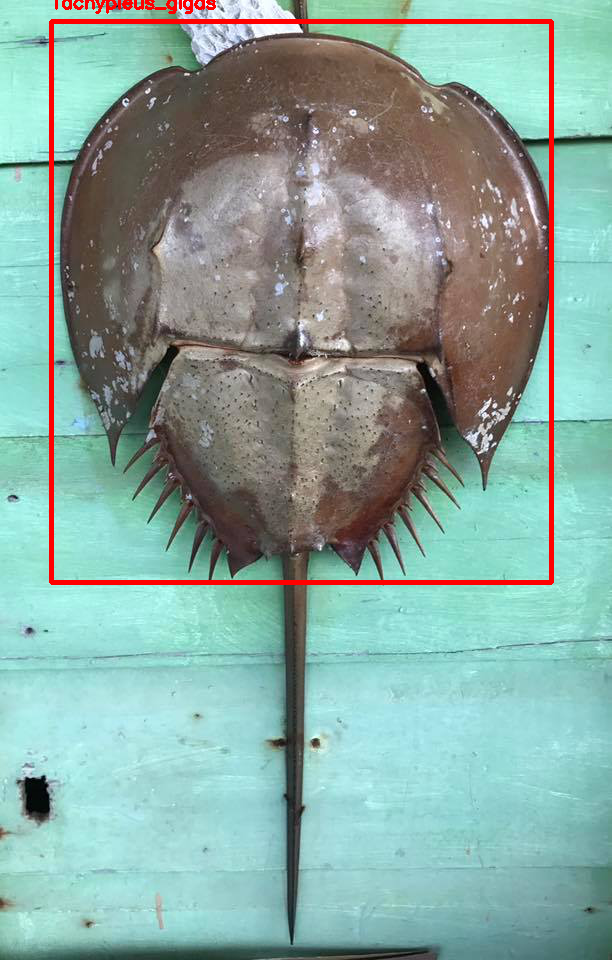

100%|██████████| 5/5 [00:06<00:00,  1.35s/it]


In [ ]:
path_to_image_folder = "./images/test"
img_files = get_image_files(path_to_image_folder)
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad((img_size,img_size)), tfms.A.Normalize()])
num_img = 1
imgs_array = [PIL.Image.open(Path(fname)) for fname in img_files[0:5]]
Pre_imgs_array = []
predict = []
for img in tqdm(imgs_array):
  pred_dict  = model_type.end2end_detect(img, valid_tfms, model, class_map=class_map, detection_threshold=0.7)
  print("ภาพที่ %.2f" %num_img)
  img_out = img
  img_out = np.array(img_out)

  for i in tqdm(range(len(pred_dict['detection']['bboxes']))):
    pre = pred_dict['detection']['bboxes'][i-1]
    BBox_tensor = pre.to_tensor()
    BBox_list= BBox_tensor.tolist()
    # Setting the points for cropped image
    left = int(BBox_list[0])
    top = int(BBox_list[1])
    right = int(BBox_list[2])
    bottom = int(BBox_list[3])

    # crop image
    im1 = img.crop((left, top, right, bottom))
  

    # im1.show()
    im1.resize((224,224))
    trans = transforms.ToPILImage()
    trans1 = transforms.ToTensor()
    im1 = trans(trans1(im1))
    im2 = np.array(im1)
    Pre_BF = learn_BF.predict(im2)[0]
    
    if Pre_BF == 'front' :# predict back or front
          Pre_F = learn_F.predict(im2)
          classes = ['Carcinoscorpius_rotundicauda', 'Tachypleus_gigas']
          prop_F = Pre_F[2].max()
          prop_float = prop_F.item()
          if prop_float > 0.5 : #weight predict 
            print('class:',Pre_F[0], ",accuracy =", '%.3f' %prop_float)
            predict.append(Pre_F[0])
            # Draw draw boxes
            xmin = int(BBox_list[0])
            ymin = int(BBox_list[1])
            xmax = int(BBox_list[2])
            ymax = int(BBox_list[3])
            cv2.rectangle(img_out, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(img_out, 
                   Pre_F[0], 
                    (xmin, ymin - 13), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    1e-3 * int(pred_dict['height']), 
                    (255,0,0), 2)
            
          else:
            classes.remove(Pre_F[0])
            predict.append(classes[0])
            print('class:',classes[0], ",accuracy =", '%.3f' %prop_float)
            # Draw draw boxes
            xmin = int(BBox_list[0])
            ymin = int(BBox_list[1])
            xmax = int(BBox_list[2])
            ymax = int(BBox_list[3])
            cv2.rectangle(img_out, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(img_out, 
                   classes[0], 
                    (xmin, ymin - 13), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    1e-3 * int(pred_dict['height']), 
                    (255,0,0), 2)

    else:
          Pre_B = learn_B.predict(im2)
          prop_B = Pre_B[2].max()
          prop_float = prop_B.item()
          classes = ['Carcinoscorpius_rotundicauda', 'Tachypleus_gigas']
          if prop_float > 0.5 :#weight predict 
            print('class:',Pre_B[0], ",accuracy =", '%.3f' %prop_float)
            predict.append(Pre_B[0])
            # Draw draw boxes
            xmin = int(BBox_list[0])
            ymin = int(BBox_list[1])
            xmax = int(BBox_list[2])
            ymax = int(BBox_list[3])
            cv2.rectangle(img_out, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(img_out, 
                   Pre_B[0], 
                    (xmin, ymin - 13), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    1e-3 * int(pred_dict['height']), 
                    (255,0,0), 2)

          else:
            classes.remove(Pre_B[0])
            predict.append(classes[0])
            print('class:',classes[0], ",accuracy =", '%.3f' %prop_float)
            # Draw draw boxes
            xmin = int(BBox_list[0])
            ymin = int(BBox_list[1])
            xmax = int(BBox_list[2])
            ymax = int(BBox_list[3])
            cv2.rectangle(img_out, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(img_out, 
                   classes[0], 
                    (xmin, ymin - 13), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    1e-3 * int(pred_dict['height']), 
                    (255,0,0), 2)
          sleep(.01)

  img_out = Image.fromarray(img_out)
  display(img_out)

  Pre_imgs_array.append(img_out)
  img_out = img_out.save("prediction " + str(num_img) + '.png')
  num_img = num_img +1
  sleep(0.001)

In [ ]:
for img in Pre_imgs_array:
  display(img)

# Test model with COCO matric

## load data and load model

In [ ]:
cd /content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp

/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp


In [ ]:
# โหลดโมเดลที่เซฟมาเพื่อทำนายผลใน test set
model_loaded = model_from_checkpoint("./model_OBJ/mangda_det_660.pth")
model = model_loaded['model']
model_type = model_loaded["model_type"]
backbone = model_loaded["backbone"]
class_map = model_loaded["class_map"]
img_size = model_loaded["img_size"]
model_type, backbone, class_map, img_size

In [ ]:
template_record = ObjectDetectionRecord()

class YoloSmallDataset(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
        self.df = pd.read_csv("/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/test_annotation.csv")
        self.class_map = ClassMap(list(self.df['label'].unique()))

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def parse_fields(self, o, record, is_new):
        if is_new:
            record.set_filepath(op.join("/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/", "test", o.filename))
            record.set_img_size(ImgSize(width=o.width, height=o.height))
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

In [ ]:
#เปลี่ยนภาพ และ label เป็น records
parser = YoloSmallDataset(template_record)
train_records, valid_records = parser.parse()

  0%|          | 0/142 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/65 [00:00<?, ?it/s]

WARNING  - (record_id: B_C (31).jpg) - 🚫 Record could not be autofixed and will be removed because: File '/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/images/test/B_C (31).jpg' does not exist | icevision.core.record:autofix_records:104
AUTOFIX-SUCCESS - (record_id: F_C (17).jpg) - Clipping bbox xmax from 185 to image width 0 (Before: <BBox (xmin:20, ymin:87, xmax:185, ymax:299)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: F_C (17).jpg) - Clipping bbox ymax from 299 to image height 0 (Before: <BBox (xmin:20, ymin:87, xmax:0, ymax:299)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: F_C (17).jpg) - Cannot auto-fix coordinates: <BBox (xmin:20, ymin:87, xmax:0, ymax:0)>
	x_min:20 is greater than or equal to x_max:0
	y_min:87 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: F_C (17).jpg) - Clipping bbox xmax from 427 to image width 0 (Before: <BBox (xmin:2

In [ ]:
len(train_records), len(valid_records)
test_records = train_records + valid_records
len(test_records)

63

In [ ]:
# ทำdataloader
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad((img_size,img_size)), tfms.A.Normalize()])
test_ds = Dataset(test_records, valid_tfms)
test_dl = model_type.train_dl(test_ds, batch_size=32, num_workers=2, shuffle=True)

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]
learner = model_type.fastai.learner(dls= [test_dl], model=model, metrics=metrics)

In [ ]:
#COCO matric score:
learner.validate(dl = test_dl)

/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


(#2) [1.0264698266983032,0.27591463014925466]

# Confusion_matrix()

In [98]:
cd /content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp

/content/gdrive/MyDrive/bata_Horsehoe_Crab_classiflication/betaApp


In [ ]:
# โหลดโมเดลที่เซฟมาเพื่อทำนายผลใน test set
model_loaded = model_from_checkpoint("./model_OBJ/mangda_det_660.pth")
model = model_loaded['model']
model_type = model_loaded["model_type"]
backbone = model_loaded["backbone"]
class_map = model_loaded["class_map"]
img_size = model_loaded["img_size"]
model_type, backbone, class_map, img_size

In [114]:
#โหลดโมเดลที่เซฟมาเพื่อทำนายผลใน test set
learn_BF = load_learner('./model_back_front/VGG16_fastai.pkl')
learn_B = load_learner('./model_back/densenet201_fastai.pkl')
learn_F = load_learner('./model_front/resnext50_fastai.pkl')

In [115]:
#โหลดไฟล์ภาพจากโฟลเดอร์
path_T = "./img_split/test/Tachypleus_gigas"
path_C = './img_split/test/Carcinoscorpius_rotundicauda'

In [116]:
# ฟังก์ชัน ในการทำนายผล
def Pre_multi_model(path_to_image_folder, label_fol):
  img_files = get_image_files(path_to_image_folder)
  valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad((img_size,img_size)), tfms.A.Normalize()])
  num_img = 1
  imgs_array = [PIL.Image.open(Path(fname)) for fname in img_files]
  Pre_imgs_array = []
  label = []
  predict = []
  for img in tqdm(imgs_array):
    pred_dict  = model_type.end2end_detect(img, valid_tfms, model, class_map=class_map, detection_threshold=0.7)
    # print("ภาพที่ %.2f" %num_img)
    img_out = img
    img_out = np.array(img_out)

    for i in range(len(pred_dict['detection']['bboxes'])):
      pre = pred_dict['detection']['bboxes'][i-1]
      BBox_tensor = pre.to_tensor()
      BBox_list= BBox_tensor.tolist()
      # Setting the points for cropped image
      left = int(BBox_list[0])
      top = int(BBox_list[1])
      right = int(BBox_list[2])
      bottom = int(BBox_list[3])

      # crop image
      im1 = img.crop((left, top, right, bottom))
    

      # im1.show()
      im1.resize((224,224))
      trans = transforms.ToPILImage()
      trans1 = transforms.ToTensor()
      im1 = trans(trans1(im1))
      im2 = np.array(im1)
      Pre_BF = learn_BF.predict(im2)[0]
      
      if Pre_BF == 'front' :# predict back or front
            Pre_F = learn_F.predict(im2)
            classes = ['Carcinoscorpius_rotundicauda', 'Tachypleus_gigas']
            prop_F = Pre_F[2].max()
            prop_float = prop_F.item()

              # print('class:',Pre_F[0], ",accuracy =", '%.3f' %prop_float)
            predict.append(Pre_F[0])
            label.append(label_fol)
              # Draw draw boxes
            xmin = int(BBox_list[0])
            ymin = int(BBox_list[1])
            xmax = int(BBox_list[2])
            ymax = int(BBox_list[3])
            cv2.rectangle(img_out, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(img_out, 
                    Pre_F[0], 
                      (xmin, ymin - 13), 
                      cv2.FONT_HERSHEY_SIMPLEX, 
                      1e-3 * int(pred_dict['height']), 
                      (255,0,0), 2)
              

      else:
            Pre_B = learn_B.predict(im2)
            prop_B = Pre_B[2].max()
            prop_float = prop_B.item()
            classes = ['Carcinoscorpius_rotundicauda', 'Tachypleus_gigas']

              # print('class:',Pre_B[0], ",accuracy =", '%.3f' %prop_float)
            predict.append(Pre_B[0])
            label.append(label_fol)
              # Draw draw boxes
            xmin = int(BBox_list[0])
            ymin = int(BBox_list[1])
            xmax = int(BBox_list[2])
            ymax = int(BBox_list[3])
            cv2.rectangle(img_out, (xmin,ymin), (xmax,ymax), (255,0,0), 3)
            cv2.putText(img_out, 
                    Pre_B[0], 
                      (xmin, ymin - 13), 
                      cv2.FONT_HERSHEY_SIMPLEX, 
                      1e-3 * int(pred_dict['height']), 
                      (255,0,0), 2)

              
    img_out = Image.fromarray(img_out)
    # display(img_out)

    Pre_imgs_array.append(img_out)
    # img_out = img_out.save("prediction " + str(num_img) + '.png')
    num_img = num_img +1
    sleep(0.001)
    os.system('cls')
  return predict, label, Pre_imgs_array #คืนค่าเป็น list ของค่าที่ทำนาย,list ของค่าจริง, และ array ของภาพที่มีการระบุตำแหน่งแล้ว

In [117]:
#ทำนายผลจากไฟล์ภาพในโฟลเดอร์ 'Tachypleus_gigas' และ 'Carcinoscorpius_rotundicauda'
result_T = Pre_multi_model(path_to_image_folder=path_T, label_fol= 'Tachypleus_gigas' )
result_C = Pre_multi_model(path_to_image_folder=path_C, label_fol= 'Carcinoscorpius_rotundicauda' )

  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


  5%|▌         | 1/20 [00:00<00:15,  1.24it/s]

 10%|█         | 2/20 [00:01<00:15,  1.16it/s]

 15%|█▌        | 3/20 [00:03<00:22,  1.30s/it]

 20%|██        | 4/20 [00:04<00:17,  1.09s/it]

 25%|██▌       | 5/20 [00:05<00:14,  1.02it/s]

 30%|███       | 6/20 [00:05<00:12,  1.09it/s]

 35%|███▌      | 7/20 [00:06<00:11,  1.16it/s]

 40%|████      | 8/20 [00:07<00:10,  1.12it/s]

 45%|████▌     | 9/20 [00:08<00:09,  1.17it/s]

 50%|█████     | 10/20 [00:09<00:08,  1.21it/s]

 55%|█████▌    | 11/20 [00:10<00:08,  1.03it/s]

 60%|██████    | 12/20 [00:11<00:08,  1.08s/it]

 65%|██████▌   | 13/20 [00:12<00:06,  1.01it/s]

 70%|███████   | 14/20 [00:13<00:05,  1.07it/s]

 75%|███████▌  | 15/20 [00:14<00:04,  1.14it/s]

 80%|████████  | 16/20 [00:14<00:03,  1.15it/s]

 85%|████████▌ | 17/20 [00:15<00:02,  1.20it/s]

 90%|█████████ | 18/20 [00:16<00:01,  1.22it/s]

 95%|█████████▌| 19/20 [00:17<00:00,  1.06it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  5%|▌         | 1/20 [00:00<00:14,  1.29it/s]

 10%|█         | 2/20 [00:01<00:14,  1.25it/s]

 15%|█▌        | 3/20 [00:03<00:18,  1.09s/it]

 20%|██        | 4/20 [00:04<00:17,  1.09s/it]

 25%|██▌       | 5/20 [00:04<00:14,  1.01it/s]

 30%|███       | 6/20 [00:05<00:12,  1.08it/s]

 35%|███▌      | 7/20 [00:06<00:13,  1.02s/it]

 40%|████      | 8/20 [00:07<00:11,  1.07it/s]

 45%|████▌     | 9/20 [00:08<00:09,  1.12it/s]

 50%|█████     | 10/20 [00:09<00:08,  1.17it/s]

 55%|█████▌    | 11/20 [00:10<00:07,  1.20it/s]

 60%|██████    | 12/20 [00:10<00:06,  1.23it/s]

 65%|██████▌   | 13/20 [00:12<00:06,  1.05it/s]

 70%|███████   | 14/20 [00:12<00:05,  1.10it/s]

 75%|███████▌  | 15/20 [00:13<00:04,  1.15it/s]

 80%|████████  | 16/20 [00:14<00:03,  1.14it/s]

 85%|████████▌ | 17/20 [00:15<00:02,  1.18it/s]

 90%|█████████ | 18/20 [00:16<00:02,  1.02s/it]

 95%|█████████▌| 19/20 [00:17<00:00,  1.02it/s]

100%|██████████| 20/20 [00:21<00:00,  1.07s/it]


In [118]:
#วัด accuracy และ F1 score
Pre_T = Counter(result_T[0])
label_T = Counter(result_T[1])
print('T predict',Pre_T)
print('T Label', label_T)

Pre_C = Counter(result_C[0])
label_C = Counter(result_C[1])
print('C predict',Pre_C)
print('C Label', label_C)

TPs = Pre_T['Tachypleus_gigas']
FPs = Pre_T['Carcinoscorpius_rotundicauda']
TNs = Pre_C['Carcinoscorpius_rotundicauda']
FNs = Pre_C['Tachypleus_gigas']

#calculate F1 Score 
Precision = TPs / (TPs + FPs)
Recall = TPs/(TPs+FNs)
F1 = 2*(Precision*Recall)/(Precision + Recall)

#calculate accuracy
accuracy = (TPs + TNs)/(TPs + TNs + FPs + FNs)

print('accuracy:',f'{accuracy:.2f}')
print('Precision:'f'{Precision:.2f}')
print('Recall:'f'{Recall:.2f}')
print('F1 score:'f'{F1:.2f}')

T predict Counter({'Tachypleus_gigas': 21, 'Carcinoscorpius_rotundicauda': 5})
T Label Counter({'Tachypleus_gigas': 26})
C predict Counter({'Carcinoscorpius_rotundicauda': 22, 'Tachypleus_gigas': 8})
C Label Counter({'Carcinoscorpius_rotundicauda': 30})
accuracy: 0.77
Precision:0.81
Recall:0.72
F1 score:0.76


In [119]:
#function plot confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [125]:
#create tensor of label and tensor of prediction
targets = result_C[1]+result_T[1]
preds = result_C[0]+result_T[0]

In [126]:
 #create confusion matrix from sklearn and mathplotlib
 cm = confusion_matrix(targets, preds)
 print(type(cm))
 cm

<class 'numpy.ndarray'>


array([[22,  8],
       [ 5, 21]])

Confusion matrix, without normalization
[[22  8]
 [ 5 21]]


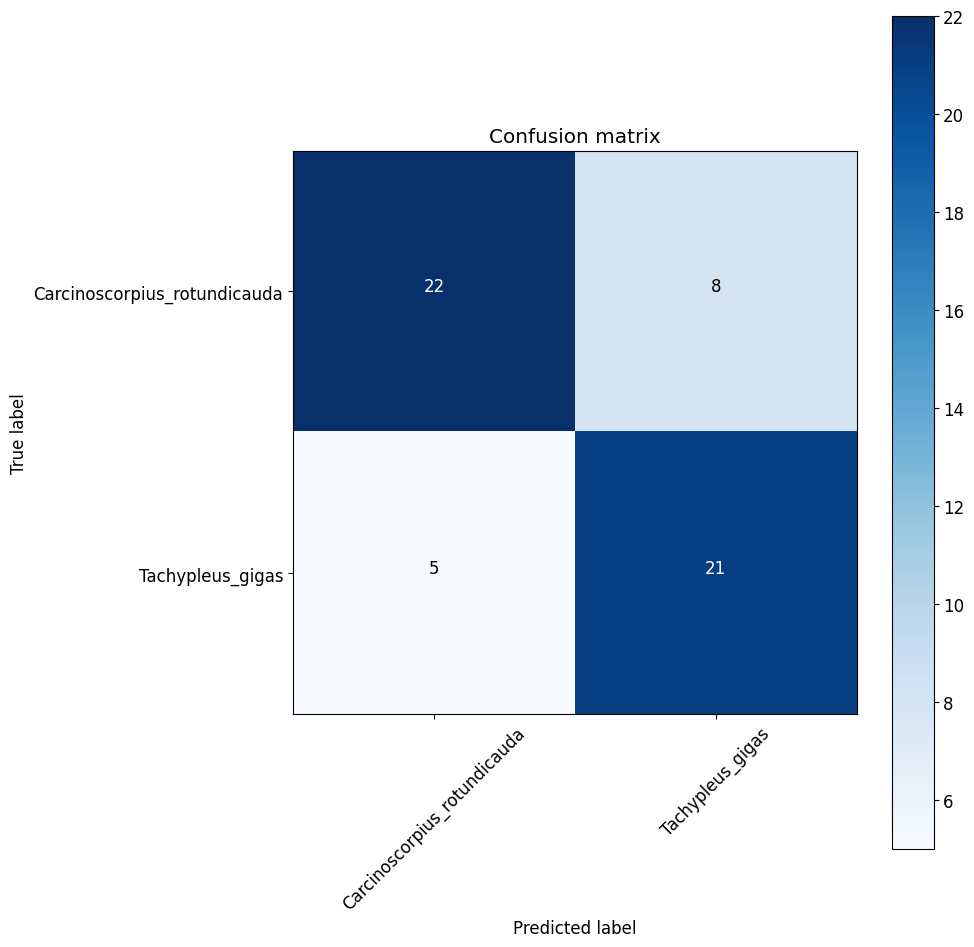

In [127]:
#set variable
classes = ['Carcinoscorpius_rotundicauda', 'Tachypleus_gigas' ]
plt.figure(figsize=(10,10))
plot_confusion_matrix(cm, classes)
plt.show()